In [1]:
import keras
from keras.datasets import cifar10
from keras.models import Sequential, model_from_json
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, AveragePooling2D
from keras.preprocessing import image
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np

Using TensorFlow backend.


### View Image Data Set (Exploratory)

In [2]:
# List of names for each CIFAR10 class
cifar10_class_names = {
    0: "Airplane",
    1: "Automobile",
    2: "Bird",
    3: "Cat",
    4: "Deer",
    5: "Dog",
    6: "Frog",
    7: "Horse",
    8: "Ship",
    9: "Truck"
}

In [4]:
# Load the entire data set to memory
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

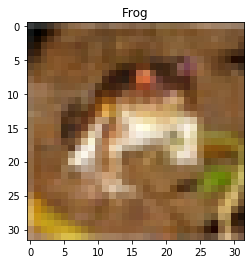

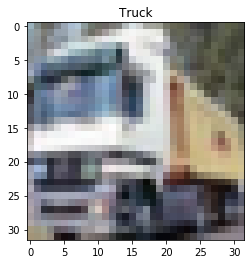

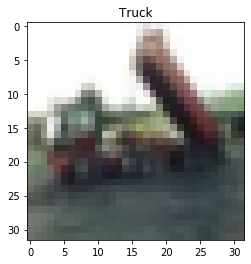

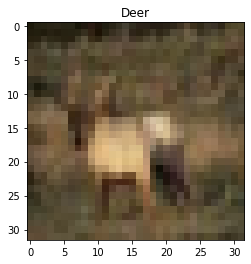

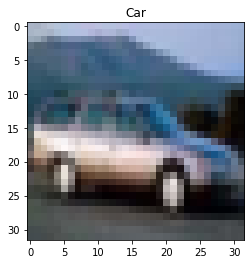

...

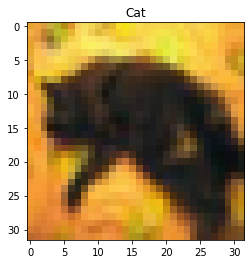

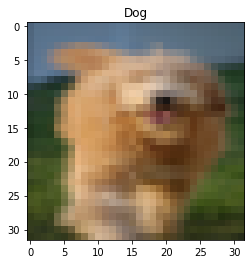

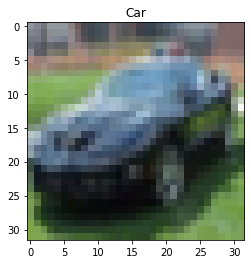

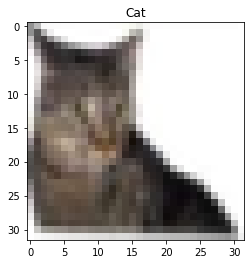

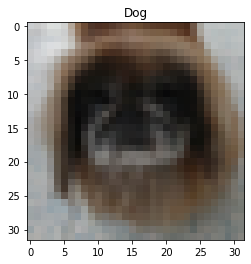

In [5]:
# Loop through the first 1000 images with a for loop
for i in range(1000):
    # Grab an image from the data set
    sample_image = x_train[i]
    # Grab the image's expected class id
    image_class_number = y_train[i][0]
    # Look up the string name of that label from the list of labels we have at the top
    image_class_name = cifar10_class_names[image_class_number]

    # Draw the image as a plot
    plt.imshow(sample_image)
    # Label the image
    plt.title(image_class_name)
    # Show the plot on the screen
    plt.show()


### Loading Image Data Set

In [6]:
# Load data set
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Before we use the data to train a neural network, we need to normalize it.
# Neural networks work best when the input data are floating values between 0 and 1.
x_train = x_train.astype('float32') #as.type('float32') to convert the data to floating values.
x_test = x_test.astype('float32')
x_train /= 255 #Divide by 255 because our pixel data is between 0 and 255.
x_test /= 255

# Since we are creating a neural network with 10 oututs, we create a separate expected balue for each of the outputs
## Convert class vectors to binary class matrices
# Our labels are single values from 0 to 9.
# Instead, we want each label to be an array with on element set to 1 and and the rest set to 0.
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)


### Dense Layers

In [8]:
#Create a new neural network object
# Create a model and add layers
model = Sequential() #Sequential api allows us to create a neural network by adding layers to it one at a time, sequentially. 
#Adding layers with model.add in order we want our neural network
#Adding Dense Layer: Dense(nodes, activation function, size of input layer)
#Relu = Rectified Linear Unit, a standard choice whenworking with images because it works well and is computationally efficient.
#Size of input layer only on first layer in the neural network
model.add(Dense(512, activation = "relu", input_shape=(32, 32, 3)))
#Output layer, needs one node in the output layer for each kind of object we want to detect. In our case, 10 different kinds of objects.
#When doing classification with more than one type of object, the output layer will almost always use a softmax activation function.
#The softmax activation function is a special function that makes sure all the outut values from this layer add up to exactly 1.
model.add(Dense(10, activation = "softmax"))

In [9]:
# Print a summary of the model to look at what the neural network structure looks like so far.
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_3 (Dense)              (None, 32, 32, 512)       2048      
_________________________________________________________________
dense_4 (Dense)              (None, 32, 32, 10)        5130      
Total params: 7,178
Trainable params: 7,178
Non-trainable params: 0
_________________________________________________________________


### Convulution Layers

In [11]:
# Create a model and add layers
model = Sequential()
#There are two types of convulutional layers, 1D and 2D, since we're working with images, we want a two-dimentional convulutional layer.
#1D is more for data like sound waves.
#Conv2D(#of different filters in each layer, pass in the size of the window that we'll use when creating image tiles from each image)
#32 different filters
#(3 x 3) will split the original image into 3 x 3 tiles.
#If our image isn't divisible by 3, we'll have a few extra pixels left over on the edges.
#Instead of dropping them, we add padding to the image, padding is just extra zeros added to the edge of th eimage to make the the math work out.
#padding = "same" 
model.add(Conv2D(32, (3, 3), padding = "same", activation = "relu", input_shape = (32, 32, 3)))
#To make our neural network more powerful, we add a few more convulutional layers the same way.
model.add(Conv2D(32, (3, 3), activation = "relu"))
model.add(Conv2D(64, (3, 3), padding = "same", activation = "relu"))
model.add(Conv2D(64, (3, 3), activation = "relu"))
#Whenever we transition from convulution layers to dense layers, we need to tell keras we are no longer working with 2D data
#Flatten layer does that, no parameters required.
model.add(Flatten())
model.add(Dense(512, activation = "relu"))
model.add(Dense(10, activation = "softmax"))


In [12]:
# Print a summary of the model
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 30, 32)        9248      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 30, 30, 64)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 28, 28, 64)        36928     
_________________________________________________________________
flatten_1 (Flatten)          (None, 50176)             0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               25690624  
_________________________________________________________________
dense_6 (Dense)              (None, 10)               

### Max Pooling

In [13]:
# Create a model and add layers
#Improve efficieny by adding max pooling.
#Max pooling is where we scale down the output of the convulutional layers by keeping only the largest values and dropping the smaller ones.
#This makes the neural netowrk more efficient by throwing away the least useful data and keeping the most useful data.
#This will help speed up the training process.
model = Sequential()

model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (32, 32, 3), activation = "relu"))
model.add(Conv2D(32, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), padding = 'same', activation = "relu"))
model.add(Conv2D(64, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))

model.add(Flatten())
model.add(Dense(512, activation = "relu"))
model.add(Dense(10, activation = "softmax"))


In [14]:
# Print a summary of the model
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 30, 30, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 15, 15, 64)        18496     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 6, 6, 64)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 2304)             

### Dropout

In [15]:
# Create a model and add layers
#One of the problems with neural networks is that they can tend to memorize the input data instead of actually learning how to tell different objects apart.
#We can force the neural network to try harder to learn without memorizing the input data.
#The idea is that between certain layers, we'll randomly throw away some of the data by cutting some of the connections between the layers.
#We can do this by adding Dropout usually directly after max pulling layers or after a group of dense layers.
#The only parameter we need to pass in is the perentage of neural network connections to randomly cut out, usually between 0.25 and 0.5.
model = Sequential()

model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (32, 32, 3), activation = "relu"))
model.add(Conv2D(32, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding = 'same', activation = "relu"))
model.add(Conv2D(64, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation = "relu"))
#Here we give a 50% drop out to make the neural network work extra hard to get the last correct answer.
model.add(Dropout(0.5))
model.add(Dense(10, activation = "softmax"))

In [16]:
# Print a summary of the model
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 30, 30, 32)        9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 15, 15, 64)        18496     
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 6, 6, 64)         

### Compile Final Neural Network

In [3]:
#The final step of defining a neural network is to compile the neural network. 
#We compile and we define how we'll be training it and how we'll be measuring it accuracy.
#############################################
# Load data set
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Normalize data set to 0-to-1 range
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

# Convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

# Create a model and add layers
model = Sequential()

model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (32, 32, 3), activation = "relu"))
model.add(Conv2D(32, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding = 'same', activation = "relu"))
model.add(Conv2D(64, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(10, activation = "softmax"))

# Compile the model (several parameters)
#loss function tells keras how to check how right or how wrong the guesses from out neural network are.
#Since we have 10 different possible categories for our objects with out data set, we'll use categorical crossentropy.
#Binary if we're only checking if an image belongs to one category.
#Choosing an optimization algorithm, adam = Adaptive Moment Estimation, often used for image data.
#The metrics we want the model to report during the training process, we type it into an array because we can choose to report more than one.
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [4]:
# Print a summary of the model
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 30, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 15, 15, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 64)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 13, 13, 64)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 6, 6, 64)         

## Training the Model and Saving Weights.

### Training the Model

In [6]:
#x_train is the training data set
#y_train is the expected labels for the traning data set
#batch_size is how many images we want to feed into the network at once during training.
#batch_size too low could take training a long time and never finish. Too big can cause our computer to run out of memory.
#Typical batch sizes are between 32 and 128 images.
#One full pass through the entire data set is called an epoch. We need to decide how many times we want to go through our training data set during the process.
#In general the larger the data set, the less training passes you would want to apply.
#Validation set.
#Need to make sure the order of the training data is randomized. 
#It is very important that neural networks sees the training data batches in random order, so that the order of the training data does not influence the training.
#Shuffle = True is usually default and do not need to put it in, Not shuffling the data can cause our model to fail to train correctly.

# Train the model
model.fit(x_train, y_train, batch_size = 32, epochs = 30, validation_data = (x_test, y_test), shuffle = True)

# Save neural network structure
model_structure = model.to_json()
f = Path("model_structure.json")
f.write_text(model_structure)

# Save neural network's trained weights
model.save_weights("model_weights.h5")

Train on 50000 samples, validate on 10000 samples
Epoch 1/30
50000/50000 [==============================] - 127s 3ms/step - loss: 1.5411 - accuracy: 0.4374 - val_loss: 1.1280 - val_accuracy: 0.6049
Epoch 2/30
50000/50000 [==============================] - 118s 2ms/step - loss: 1.1406 - accuracy: 0.5945 - val_loss: 0.9770 - val_accuracy: 0.6565
Epoch 3/30
50000/50000 [==============================] - 121s 2ms/step - loss: 0.9879 - accuracy: 0.6498 - val_loss: 0.8891 - val_accuracy: 0.6941
Epoch 4/30
50000/50000 [==============================] - 120s 2ms/step - loss: 0.9040 - accuracy: 0.6838 - val_loss: 0.8060 - val_accuracy: 0.7180
Epoch 5/30
50000/50000 [==============================] - 119s 2ms/step - loss: 0.8308 - accuracy: 0.7071 - val_loss: 0.7575 - val_accuracy: 0.7357
Epoch 6/30
50000/50000 [==============================] - 112s 2ms/step - loss: 0.7904 - accuracy: 0.7206 - val_loss: 0.7318 - val_accuracy: 0.7455
Epoch 7/30
50000/50000 [==============================] - 107s

### Saving Neural Network Structure

In [10]:
#Save the trained neural network to a file so we'll be able to use it to recognize objects and images in another program.

# Save neural network structure
model_structure = model.to_json()
f = Path("model_structure.json")
f.write_text(model_structure)


4555

### Saving Weights

In [8]:
#Save the weights of the neural network.
#As a neural network is trained, the weights of each node are adjusted to control how the signals flow through the network.
#By saving and looking at the weights, we're savng how the neural network actually works.

# Save neural network's trained weights
model.save_weights("model_weights.h5")

## Trying for a Better Model

In [3]:
import keras
from keras.datasets import cifar10
from keras.models import Sequential, model_from_json
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, AveragePooling2D
from keras.preprocessing import image
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np

# Load data set
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Normalize data set to 0-to-1 range
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255

# Convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, 10)
y_test = keras.utils.to_categorical(y_test, 10)

# Create a model and add layers
model = Sequential()

model.add(Conv2D(16, (3, 3), padding = 'same', input_shape = (32, 32, 3), activation = "relu"))
model.add(Conv2D(16, (3, 3), activation = "relu"))
model.add(AveragePooling2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(32, (3, 3), padding = 'same', activation = "relu"))
model.add(Conv2D(32, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), padding = 'same', activation = "relu"))
model.add(Conv2D(64, (3, 3), activation = "relu"))
model.add(MaxPooling2D(pool_size = (2, 2)))
model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(256, activation = "relu"))
model.add(Dense(10, activation = "softmax"))

# Compile the model 
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [5]:
# Train the model
model.fit(x_train, y_train, batch_size = 128, epochs = 80, validation_data = (x_test, y_test), shuffle = True)

# Save neural network structure
model_structure = model.to_json()
f = Path("model_structure_new.json")
f.write_text(model_structure)

# Save neural network's trained weights
model.save_weights("model_weights_new.h5")

Train on 50000 samples, validate on 10000 samples
Epoch 1/80
50000/50000 [==============================] - 41s 827us/step - loss: 0.6675 - accuracy: 0.7662 - val_loss: 0.6809 - val_accuracy: 0.7702
Epoch 2/80
50000/50000 [==============================] - 44s 887us/step - loss: 0.6583 - accuracy: 0.7684 - val_loss: 0.6378 - val_accuracy: 0.7828
Epoch 3/80
50000/50000 [==============================] - 43s 863us/step - loss: 0.6611 - accuracy: 0.7683 - val_loss: 0.6393 - val_accuracy: 0.7793
Epoch 4/80
50000/50000 [==============================] - 43s 860us/step - loss: 0.6561 - accuracy: 0.7698 - val_loss: 0.6457 - val_accuracy: 0.7778
Epoch 5/80
50000/50000 [==============================] - 50s 991us/step - loss: 0.6508 - accuracy: 0.7731 - val_loss: 0.6683 - val_accuracy: 0.7727
Epoch 6/80
50000/50000 [==============================] - 48s 956us/step - loss: 0.6560 - accuracy: 0.7703 - val_loss: 0.6930 - val_accuracy: 0.7649
Epoch 7/80
50000/50000 [==============================] 

Epoch 56/80
50000/50000 [==============================] - 63s 1ms/step - loss: 0.5710 - accuracy: 0.8002 - val_loss: 0.5945 - val_accuracy: 0.7954
Epoch 57/80
50000/50000 [==============================] - 62s 1ms/step - loss: 0.5655 - accuracy: 0.8027 - val_loss: 0.6033 - val_accuracy: 0.7915
Epoch 58/80
50000/50000 [==============================] - 62s 1ms/step - loss: 0.5660 - accuracy: 0.8010 - val_loss: 0.5885 - val_accuracy: 0.8001
Epoch 59/80
50000/50000 [==============================] - 63s 1ms/step - loss: 0.5608 - accuracy: 0.8038 - val_loss: 0.5857 - val_accuracy: 0.8015
Epoch 60/80
50000/50000 [==============================] - 63s 1ms/step - loss: 0.5644 - accuracy: 0.8023 - val_loss: 0.5672 - val_accuracy: 0.8057
Epoch 61/80
50000/50000 [==============================] - 64s 1ms/step - loss: 0.5666 - accuracy: 0.8014 - val_loss: 0.5911 - val_accuracy: 0.7996
Epoch 62/80
50000/50000 [==============================] - 65s 1ms/step - loss: 0.5581 - accuracy: 0.8043 - val_

## Predictions